# Advance Lane-Finding Project
In this project, advance lane-finding through front mounted camera is to be completed through the following steps:
* camera calibration
* image gradient and color filter
* lane-finding with curvature

In [2]:
%load_ext autoreload
%autoreload 2

## I. Camera Calibration
In order to calibrate camera, we will:
* use chessboard images
* find corners 
* find the transforming matrix to transform the image to a top-down (front) view

### A. Getting Chesboard Images

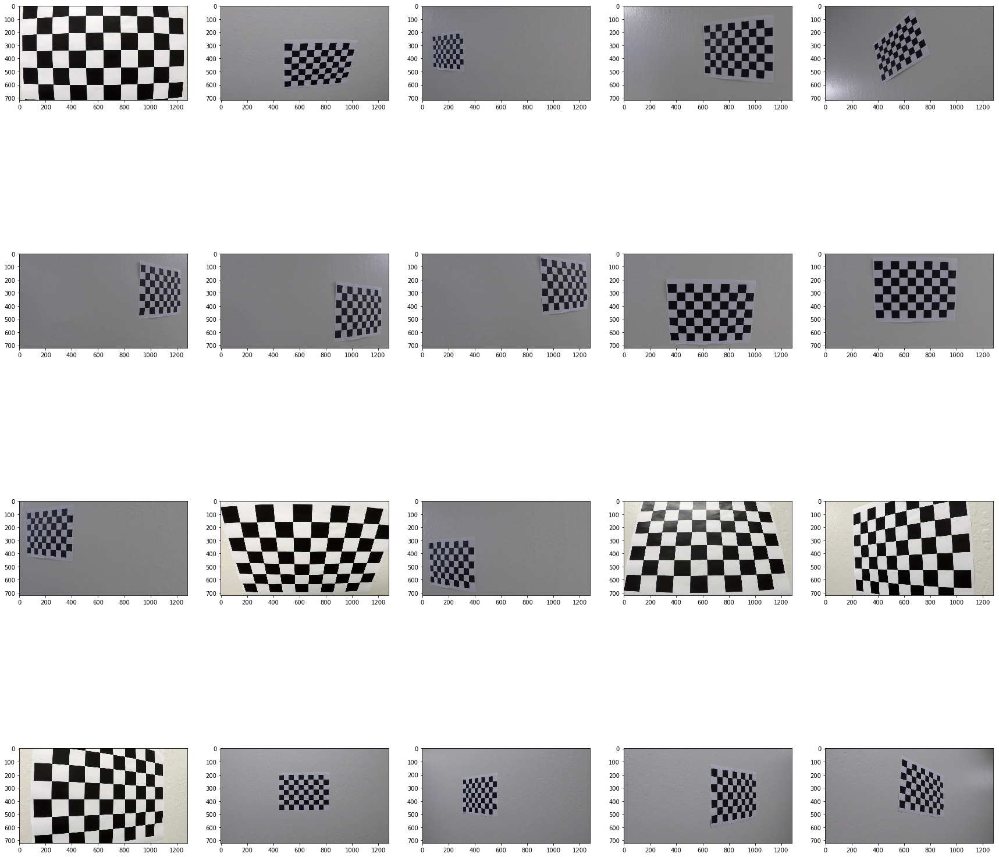

In [3]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os

img_dir = 'camera_cal/'
num_img = len(os.listdir(img_dir))
fig = plt.figure(figsize=(30,30))

for i,img_path in enumerate(os.listdir(img_dir)):
    img = cv2.imread(img_dir + img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    fig.add_subplot(4,num_img/4,i+1)
    plt.imshow(img_rgb)
plt.show()


### B. Obtaining Object Points and Image Points
In this step we also collect object points and image points by finding the corners of the chessboard. 
* specify the number of points in x and y direction
* obtain object points and image points

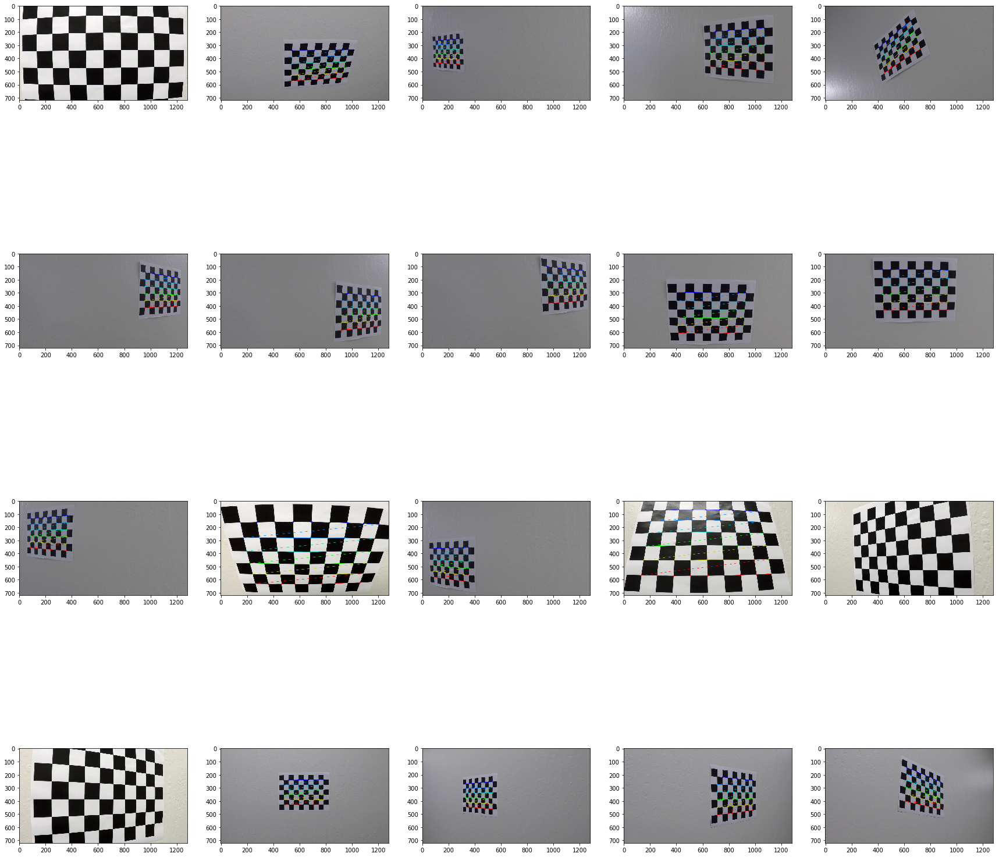

In [3]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os

img_folder = 'camera_cal/'
num_img = len(os.listdir(img_folder))
fig = plt.figure(figsize=(30,30))

# number of corners in x-direction and y-direction
nx = 9
ny = 6

# preparing object points and image points for calibrateCamera()
# critera for termination
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.


for i,img_path in enumerate(os.listdir(img_folder)):
    img = cv2.imread(img_folder + img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    # finds and draws chessboard corners
    ret, corners = cv2.findChessboardCorners(img_gray,(nx,ny),None)
    if ret == True:
        cv2.drawChessboardCorners(img_rgb,(nx,ny),corners,ret)
        
        # if corners are found, add object points and image points
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(img_gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)
    
    fig.add_subplot(4,num_img/4,i+1)
    plt.imshow(img_rgb)
plt.show()

### C. Correcting Distortion
* Camera calibration with given object points (3D points in real world space) and image points (2D points in image space)
* undistort the images

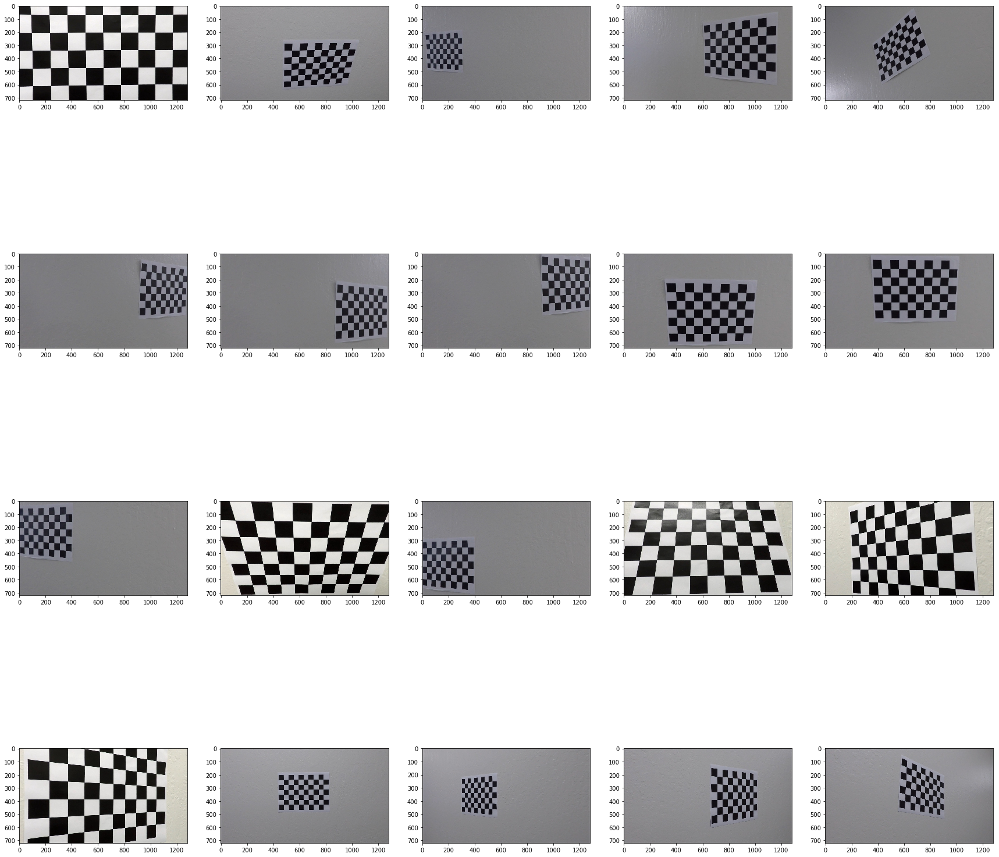

In [3]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
from src.camera_calibrator import get_obj_img_points, undistort_img

img_dir = 'camera_cal/'
num_img = len(os.listdir(img_dir))
fig = plt.figure(figsize=(30,30))

nx = 9
ny = 6
objpoints, imgpoints = get_obj_img_points(img_dir,nx,ny)

for i,img_path in enumerate(os.listdir(img_dir)):
    img = cv2.imread(img_dir + img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    img_undistorted = undistort_img(img_rgb,objpoints,imgpoints)
    
    fig.add_subplot(4,num_img/4,i+1)
    plt.imshow(img_undistorted)
plt.show()


### D. Transform Undistorted Images to Front-View Perspective
* get the 4 corners of the corners (top left, top right, bottom left, bottom right) of the undistorted images
* designate a straight rectangle for the images to be projected upon/transformed into 

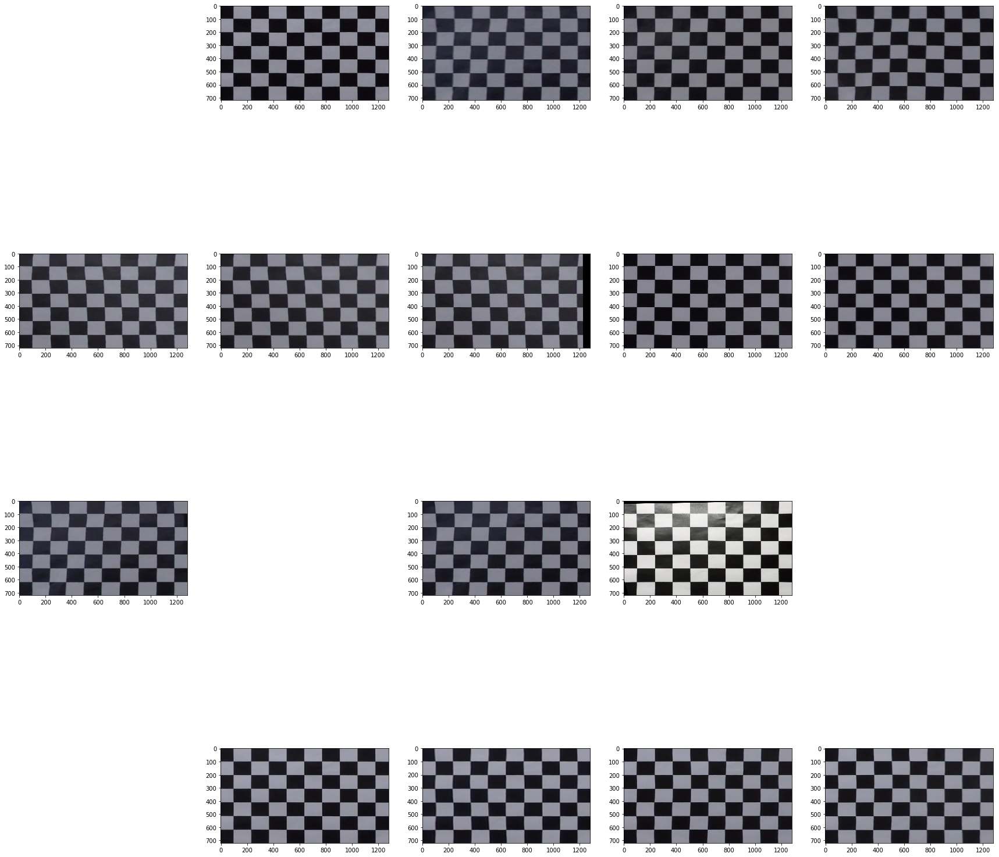

In [4]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
import src.camera_calibrator as cc

img_dir = 'camera_cal/'
num_img = len(os.listdir(img_dir))
fig = plt.figure(figsize=(30,30))

# number of corners in x-direction and y-direction
nx = 9
ny = 6

objpoints,imgpoints = cc.get_obj_img_points(img_dir,nx,ny)

for i,img_path in enumerate(os.listdir(img_dir)):
    img = cv2.imread(img_dir + img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    img_undistorted = cc.undistort_img(img_rgb,objpoints, imgpoints)

    img_undistorted_gray = cv2.cvtColor(img_undistorted,cv2.COLOR_RGB2GRAY)

    ret, corners = cv2.findChessboardCorners(img_undistorted_gray,(nx,ny),None)
        
    if ret == True:
        
        # set the source for the transform
        tl_corner, tr_corner, bl_corner, br_corner = corners[0], corners[nx-1], corners[-nx], corners[-1]
        src = np.float32([tl_corner,tr_corner,bl_corner,br_corner])
        
        # set the destination for the transform
        img_size = (img_undistorted.shape[1],img_undistorted.shape[0]) # img_size = (x_size,y_size)
        offset = 100
        dst = np.float32([[offset,offset], [img_size[0]-offset,offset], \
                          [offset,img_size[1]-offset], [img_size[0]-offset, img_size[1]-offset]])
    
        img_warped, _ = cc.transform_perspective(img_undistorted,src,dst)
    
        fig.add_subplot(4,num_img/4,i+1)
        plt.imshow(img_warped)
plt.show()


## II. Gradient and Color Filter
In this step we will construct a robust picture in grayscale capable of showing lane lines by combining the following filters:
* Canny Edge with Sobel operator (matrix) in the x direction against the images in RGB format
* Applying a threshold on the S-channel of the images in HLS format

### A. Test Images to be Used

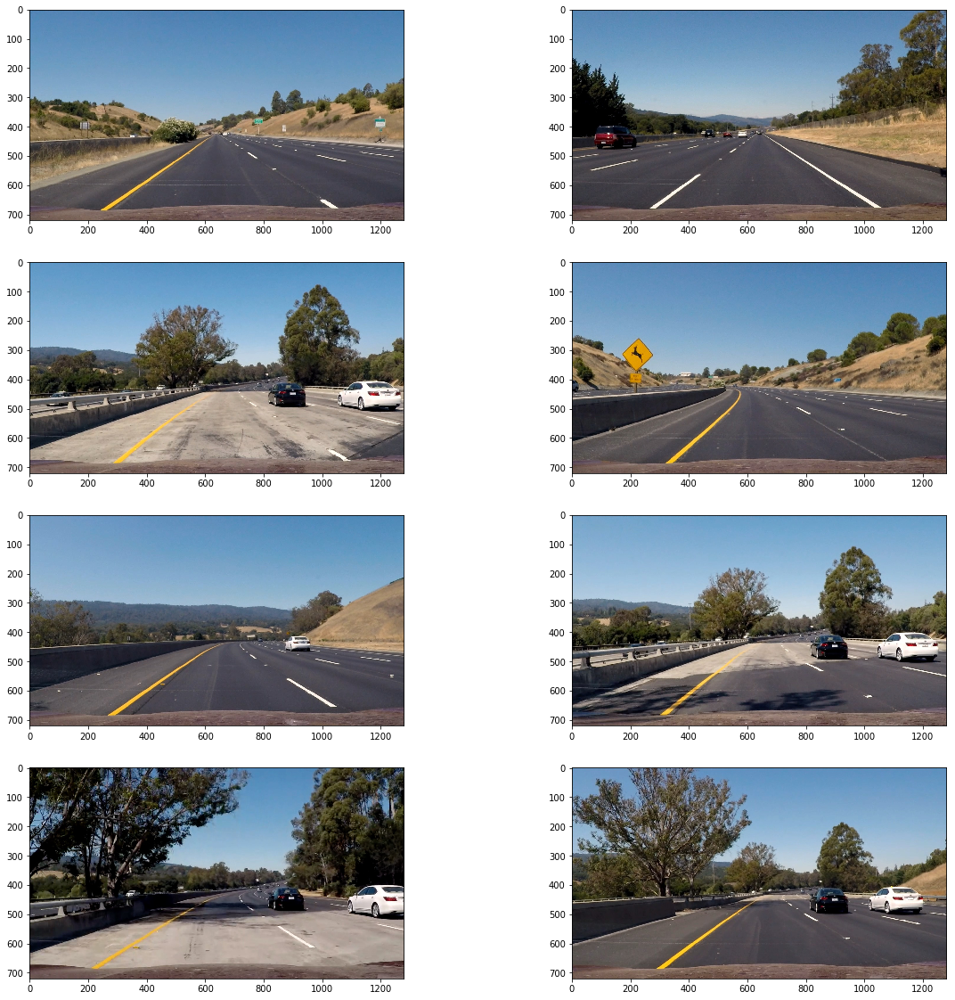

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import os

img_dir = 'test_images/'
num_img = len(os.listdir(img_dir))
fig = plt.figure(figsize=(20,20))

for i,img_path in enumerate(os.listdir(img_dir)):
    img = cv2.imread(img_dir+img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    fig.add_subplot(num_img/2, 2, i+1)
    plt.imshow(img_rgb)
plt.show()

### B. Applying Sobel in X Direction (Canny Edge)
* get the image in grayscale
* get the Sobel matrix in x direction with a kernel window
* finds the magnitude (absolute value) of Sobel matrix
* scale the magnitude (absolute value) to 8-bit 
* create a binary image according to the scaled absolute Sobel matrix with a threshold

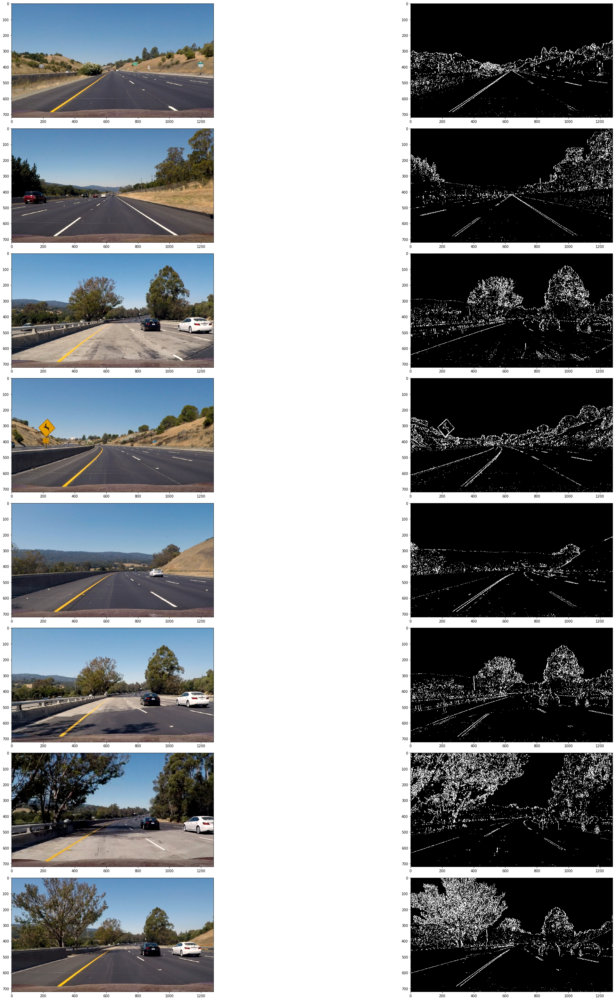

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import os

img_dir = 'test_images/'
num_img = len(os.listdir(img_dir))
fig = plt.figure(figsize=(40,40))

# kernel window size
ksize=3

# threshold of sobel binary
threshold = (20,100)

for i,img_path in enumerate(os.listdir(img_dir)):
    img = cv2.imread(img_dir+img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    # get the sobel x matrix 
    sobelx = cv2.Sobel(img_gray,cv2.CV_64F,1,0,ksize)
    
    # get the magnitude of sobel x
    sobelx_mag = np.sqrt(np.square(sobelx))
    
    # convert it to 8-bit
    sobelx_mag_scaled = np.uint8(sobelx_mag / np.max(sobelx_mag) * 255)
    
    # get the sobel binary
    binary_sobel = np.zeros_like(img_gray)
    binary_sobel[(sobelx_mag_scaled >= threshold[0]) & (sobelx_mag_scaled <= threshold[1])] = 1
    
    fig.add_subplot(num_img, 2, 2*(i+1) - 1)
    plt.imshow(img_rgb)
    fig.add_subplot(num_img, 2, 2*(i+1))
    plt.imshow(binary_sobel, cmap='gray')
    
plt.tight_layout()
plt.show()

### C. Applying a Threshold on the S-channel
* convert image to HLS format
* separate the S-channel
* apply threshold to S-channel

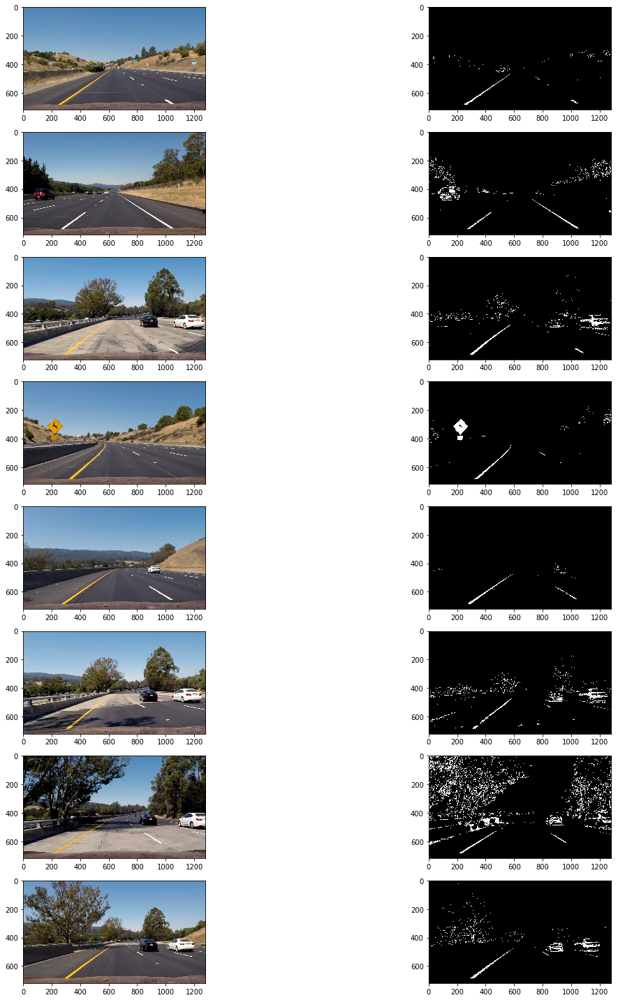

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import os

img_dir = 'test_images/'
num_img = len(os.listdir(img_dir))
fig = plt.figure(figsize=(20,20))

# threshold for s-channel
threshold = (170,255)

for i,img_path in enumerate(os.listdir(img_dir)):
    img = cv2.imread(img_dir+img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    # convert image to hls format and extract s-channel
    img_hls = cv2.cvtColor(img,cv2.COLOR_BGR2HLS)
    s_channel= img_hls[:,:,-1]
    
    # apply threshold
    binary_s = np.zeros_like(s_channel)
    binary_s[(s_channel >= threshold[0]) & (s_channel <= threshold[1])] = 1
    
    
    fig.add_subplot(num_img, 2, 2*(i+1) - 1)
    plt.imshow(img_rgb)
    fig.add_subplot(num_img, 2, 2*(i+1))
    plt.imshow(binary_s, cmap='gray')
    
plt.tight_layout()
plt.show()

### D. Combining Sobel-x Binary and S-Channel Binary

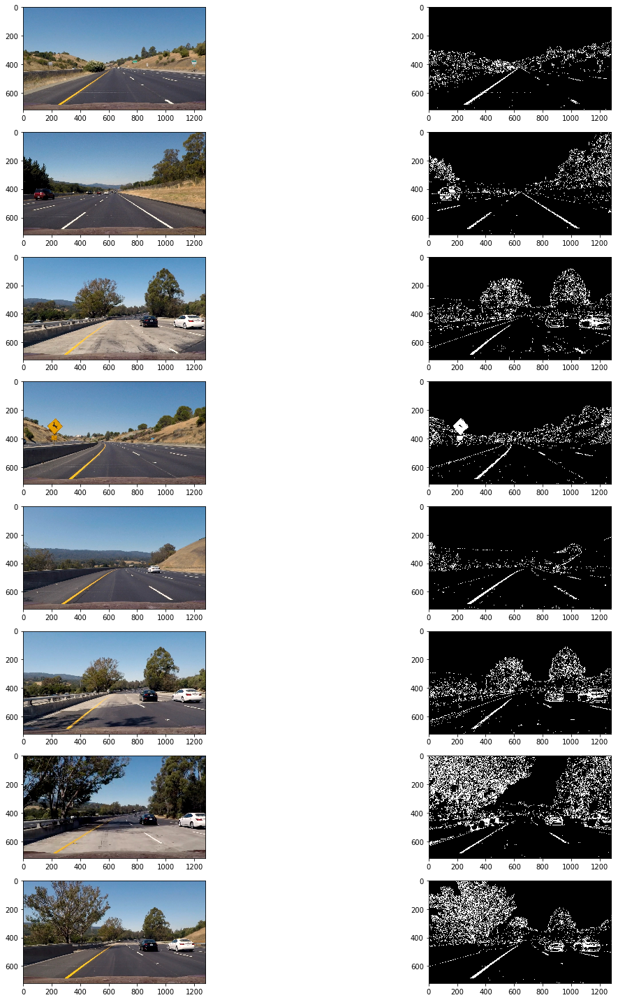

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import os
import src.image_filter as imgf

img_dir = 'test_images/'
num_img = len(os.listdir(img_dir))
fig = plt.figure(figsize=(20,20))

for i,img_path in enumerate(os.listdir(img_dir)):
    img = cv2.imread(img_dir+img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    # get the sobel-x binary
    binary_sobel = imgf.get_sobel_binary(img_rgb)
    
    # get the s-channel binary
    binary_s = imgf.get_s_channel_binary(img_rgb)
    
    # combining the 2 binaries
    binary_combined = np.zeros_like(binary_s)
    binary_combined[(binary_sobel==1) | (binary_s==1)] = 1
    
    fig.add_subplot(num_img, 2, 2*(i+1) - 1)
    plt.imshow(img_rgb)
    fig.add_subplot(num_img, 2, 2*(i+1))
    plt.imshow(binary_combined, cmap='gray')
    
plt.tight_layout()
plt.show()

## III. Lane-Line Finding with Curvature
### A. Perspective Transform
To find a straight line photo, and transform its perspective into top-down view
* find src and dst points
* project the image into top-down view
    * get obj img points
    * undistort the image
    * warp image

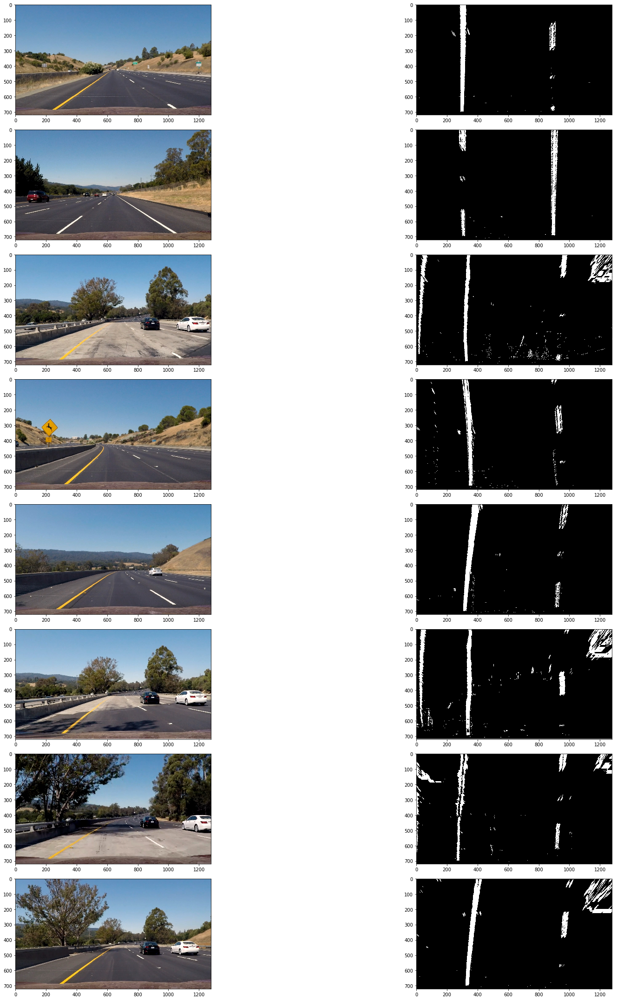

In [10]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
import src.lane_finder as lf

img_dir = 'test_images/'
num_img = len(os.listdir(img_dir))
fig = plt.figure(figsize=(30,30))

for i,img_path in enumerate(os.listdir(img_dir)):
    img = cv2.imread(img_dir+img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    img_binary_warped, trans_M = lf.get_binary_warped(img_rgb)

    fig.add_subplot(num_img, 2, 2*(i+1) - 1)
    plt.imshow(img_rgb, cmap='gray')
    
    fig.add_subplot(num_img, 2, 2*(i+1))
    plt.imshow(img_binary_warped, cmap='gray')

plt.tight_layout()
plt.show()




### B. Create Sliding Windows and Find Polynomial Fit Line
* sliding windows on the left and right
    * hyperparameters for number of windows, width size of the windows, and minimum pixel included in each window
    * iterate throughout the line and change midpoint accordingly
* polynomial fit line on the left and right lane
    * update the line according to the margin (green shaded area) instead of finding the sliding windows again

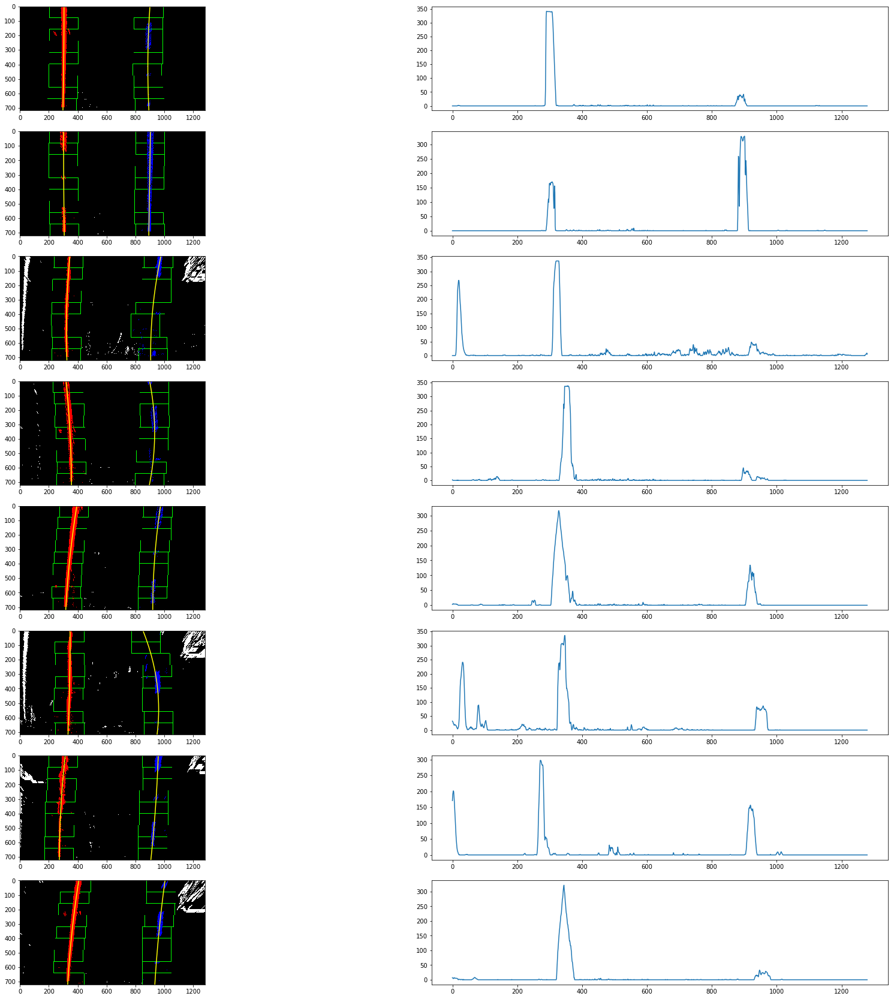

In [16]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
import src.lane_finder as lf

img_dir = 'test_images/'
num_img = len(os.listdir(img_dir))
fig = plt.figure(figsize=(30,30))

for i,img_path in enumerate(os.listdir(img_dir)):
    img = cv2.imread(img_dir+img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    img_binary_warped, trans_M = lf.get_binary_warped(img_rgb)
    histogram = np.sum(img_binary_warped[img_binary_warped.shape[0]//2:,:],axis=0)


    left_fit, right_fit, left_x, right_x, y, out_img = lf.get_poly_lines(img_binary_warped)
    
    
    fig.add_subplot(num_img, 2, 2*(i+1) - 1)
    plt.imshow(out_img)
    plt.plot(left_x,y,color='yellow')
    plt.plot(right_x,y,color='yellow')
    
    fig.add_subplot(num_img, 2, 2*(i+1))
    plt.plot(histogram)

    
plt.show()




### C. Finding the Curvature of the Lines
* get the radius of the curvature
* convert the curvature in pixel to meter

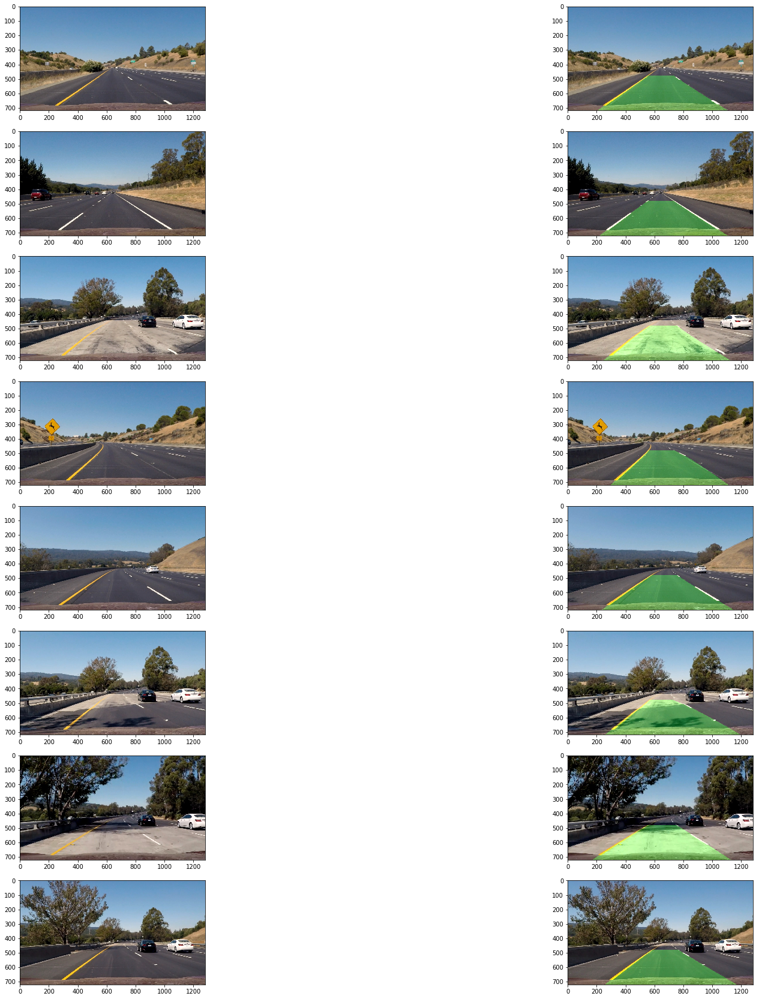

In [17]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
import src.lane_finder as lf

img_dir = 'test_images/'
num_img = len(os.listdir(img_dir))
fig = plt.figure(figsize=(30,30))

for i,img_path in enumerate(os.listdir(img_dir)):
    img = cv2.imread(img_dir+img_path)
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    img_rgb_polygon = lf.draw_lane_lines_polygon(img_rgb)
    
    
    fig.add_subplot(num_img, 2, 2*(i+1) - 1)
    plt.imshow(img_rgb)
    
    
    fig.add_subplot(num_img, 2, 2*(i+1))
    plt.imshow(img_rgb_polygon) 

plt.show()




## IV. Applying to Original Image/Video
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [22]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# import lane finding module
import src.lane_finder as lf

# apply the lines and output the curvature onto the original image
# apply the pipelines to the whole video

white_output = 'project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(lf.draw_lane_lines_polygon) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

[MoviePy] >>>> Building video project_video.mp4
[MoviePy] Writing video project_video.mp4


100%|█████████▉| 1260/1261 [1:09:57<00:03,  3.33s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video.mp4 

CPU times: user 1h 12min 37s, sys: 3min 54s, total: 1h 16min 32s
Wall time: 1h 9min 57s


**Possible improvements:**
    1. Lane tracking with sanity checks and look-ahead filter
    2. Smoothing